In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
np.random.seed(2)
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
#from keras.callbacks import EarlyS
from keras.callbacks import EarlyStopping

In [ ]:
from PIL import Image, ImageChops, ImageEnhance
import os
import itertools

In [ ]:
def convert_to_ela_image(path, quality):
    temp_filename = 'temp_file_name.jpg'
    ela_filename = 'temp_ela.png'

    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality = quality)
    temp_image = Image.open(temp_filename)

    ela_image = ImageChops.difference(image, temp_image)

    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1
    scale = 255.0 / max_diff

    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)

    return ela_image

In [ ]:
import tensorflow as tf
class Config:
    CASIA1 = "/content/drive/MyDrive/CASIA1"
    CASIA2 = "/content/drive/MyDrive/CASIA2"
    autotune = tf.data.experimental.AUTOTUNE
    epochs = 30
    batch_size = 32
    lr = 1e-3
    name = 'xception'
    n_labels = 2
    image_size = (224, 224)
    decay = 1e-6
    momentum = 0.95
    nesterov = False


In [ ]:
def compute_ela_cv(path, quality):
    temp_filename = 'temp_file_name.jpg'
    SCALE = 15
    orig_img = cv2.imread(path)
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

    cv2.imwrite(temp_filename, orig_img, [cv2.IMWRITE_JPEG_QUALITY, quality])

    # read compressed image
    compressed_img = cv2.imread(temp_filename)

    # get absolute difference between img1 and img2 and multiply by scale
    diff = SCALE * cv2.absdiff(orig_img, compressed_img)
    return diff

In [ ]:
def random_sample(path, extension=None):
    if extension:
        items = Path(path).glob(f'*.{extension}')
    else:
        items = Path(path).glob(f'*')

    items = list(items)

    p = random.choice(items)
    return p.as_posix()

# Test on a Authentic image

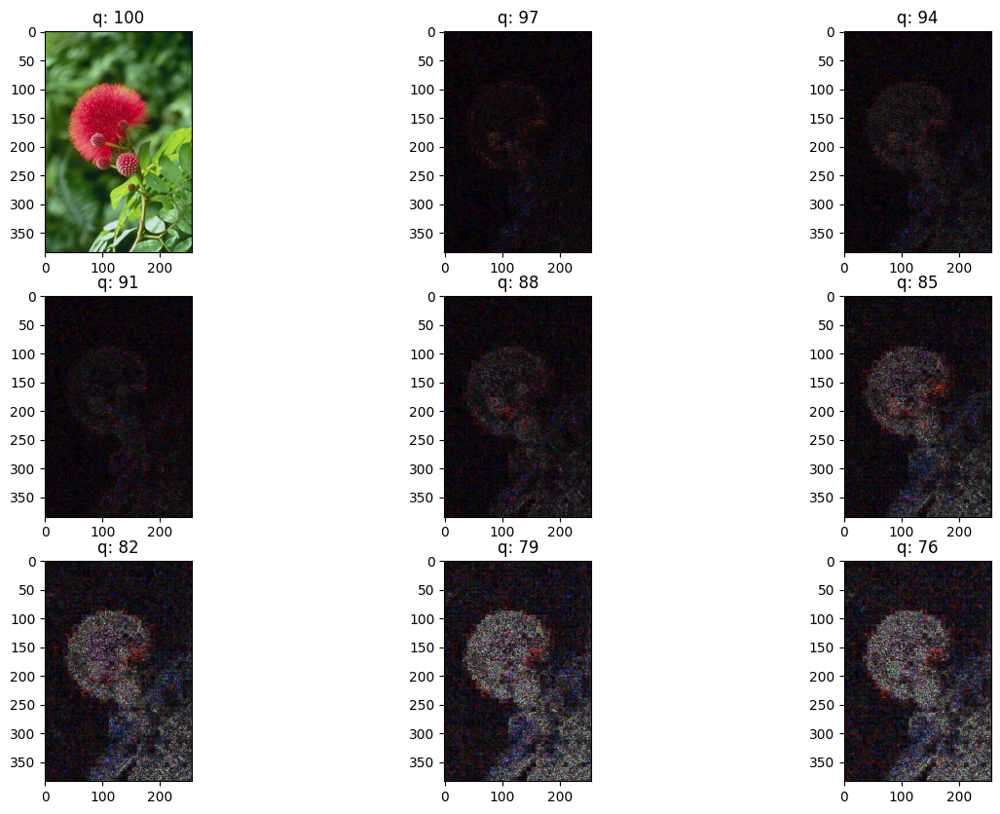

In [ ]:
import cv2
from os.path import join, exists, isdir
from pathlib import Path
import random
p = join(Config.CASIA2, 'Au/')
p = random_sample(p)
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 3
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i)
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

# Test on a tampered fake image

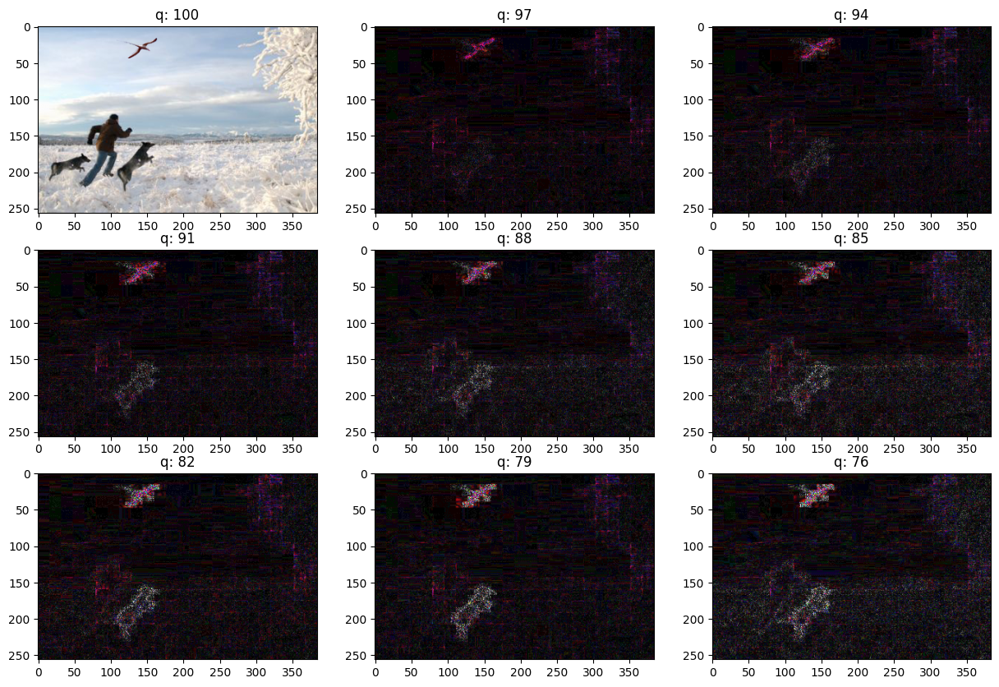

In [ ]:
p = join(Config.CASIA2, 'Tp/')
p = random_sample(p)
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 3
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i)
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

In [ ]:
# Correct the path and load the image
real_image_path = "/content/drive/MyDrive/CASIA2/Au/Au_ani_00001.jpg"
image = Image.open(real_image_path)

# Display the image
image.show()

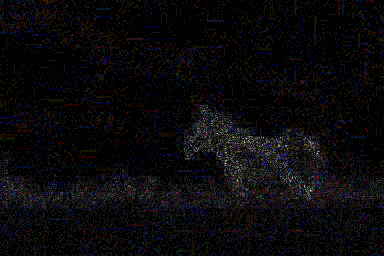

In [ ]:
convert_to_ela_image(real_image_path, 91)

In [ ]:
fake_image_path = "/content/drive/MyDrive/CASIA2/Tp/Tp_D_CND_M_N_ani00018_sec00096_00138.tif"

# Open the image
image = Image.open(fake_image_path)

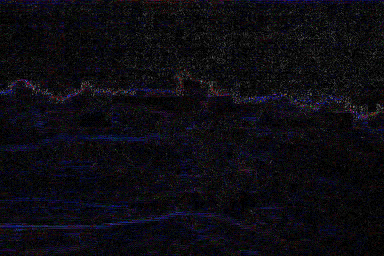

In [ ]:
convert_to_ela_image(fake_image_path, 91)

DENOISING REAL IMAGE

In [ ]:
!pip install PyWavelets

Max wavelet levels supported: 3


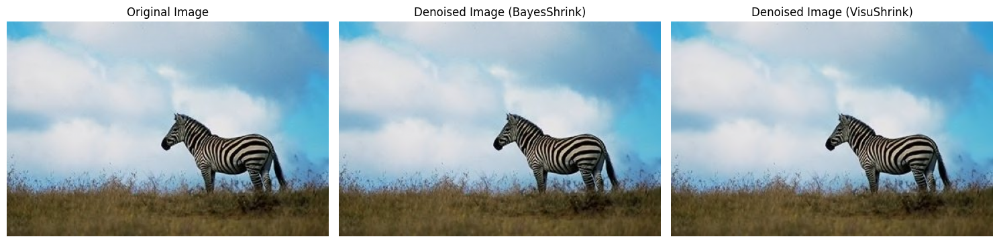

In [ ]:

from skimage.restoration import denoise_wavelet, estimate_sigma
from skimage import img_as_float, io
import matplotlib.pyplot as plt
import numpy as np
import pywt

# Load the image
img_path = "/content/drive/MyDrive/CASIA2/Au/Au_ani_00001.jpg"
img_r1 = io.imread(img_path)
img_r = img_as_float(img_r1)  # Converting the image to float

# Noise estimation
sigma_est = estimate_sigma(img_r, channel_axis=-1, average_sigmas=True)

# Determine maximum wavelet levels
max_level = pywt.dwt_max_level(min(img_r.shape[:2]), 'coif5')
print(f"Max wavelet levels supported: {max_level}")

# Denoising using BayesShrink
img_bayes = denoise_wavelet(
    img_r,
    method='BayesShrink',
    mode='soft',
    wavelet_levels=min(3, max_level),
    wavelet='coif5',
    channel_axis=-1,
    convert2ycbcr=True,
    rescale_sigma=True
)

# Denoising using VisuShrink
img_visushrink = denoise_wavelet(
    img_r,
    method='VisuShrink',
    mode='soft',
    sigma=sigma_est / 3,
    wavelet_levels=min(3, max_level),
    wavelet='coif5',
    channel_axis=-1,
    convert2ycbcr=True,
    rescale_sigma=True
)

# Clip values to valid range
img_bayes = np.clip(img_bayes, 0, 1)
img_visushrink = np.clip(img_visushrink, 0, 1)

# Plot the images
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(img_r)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(img_bayes)
axes[1].set_title('Denoised Image (BayesShrink)')
axes[1].axis('off')

axes[2].imshow(img_visushrink)
axes[2].set_title('Denoised Image (VisuShrink)')
axes[2].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import cv2
psnr_noisy = cv2.PSNR(img_r,img_r)
psnr_noisy

361.20199909921956

In [ ]:
psnr_bayes = cv2.PSNR(img_r,img_bayes)
psnr_bayes

122.97024643051518

In [ ]:
psnr_visu = cv2.PSNR(img_r,img_visushrink)
psnr_visu

100.45353160704809

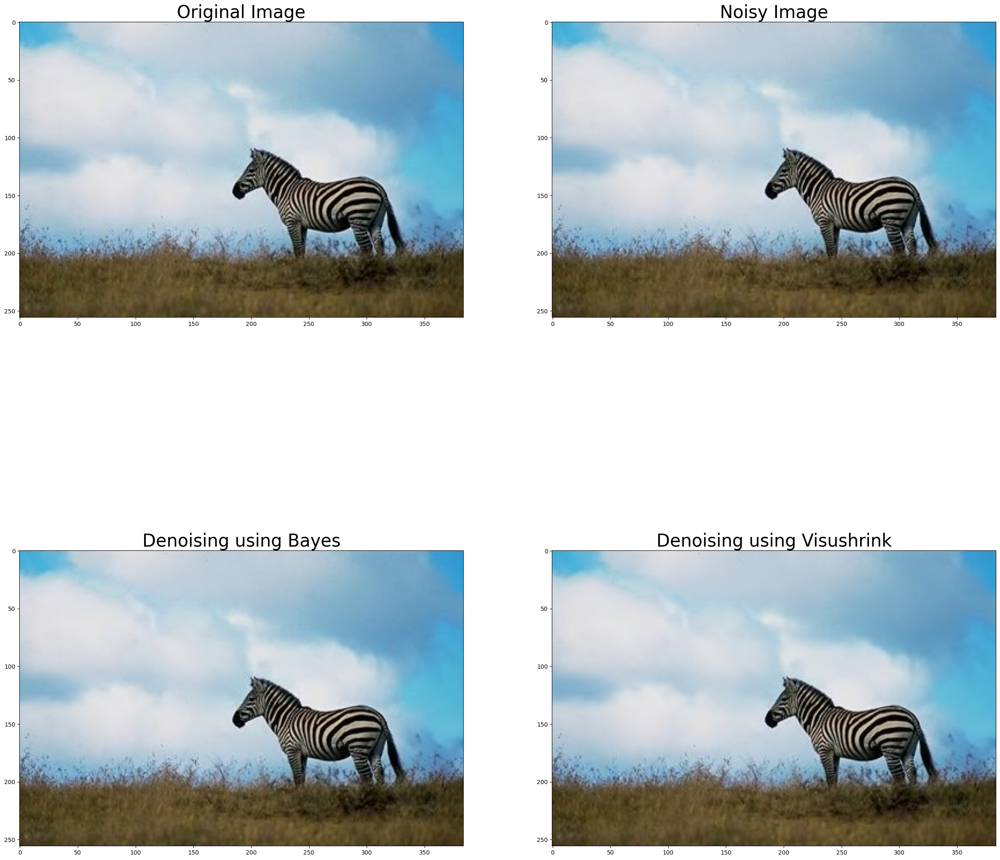

In [ ]:
# Plotting images
plt.figure(figsize=(30,30))

plt.subplot(2,2,1)
plt.imshow(img_r1,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,2)
plt.imshow(img_r,cmap=plt.cm.gray)
plt.title('Noisy Image',fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_bayes,cmap=plt.cm.gray)
plt.title('Denoising using Bayes',fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_visushrink,cmap=plt.cm.gray)
plt.title('Denoising using Visushrink',fontsize=30)

plt.show()

In [ ]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)

PSNR[Original vs. Noisy Image] 361.20199909921956
PSNR[Original vs. Denoised(VisuShrink)] 100.45353160704809
PSNR[Original vs. Denoised(Bayes)] 122.97024643051518


DENOISING FAKE IMAGE

Max wavelet levels supported: 3


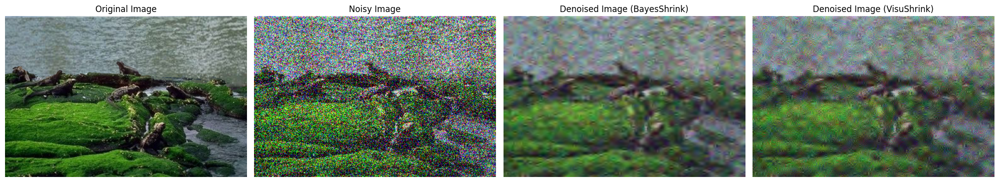

In [ ]:
from skimage.restoration import denoise_wavelet, estimate_sigma
from skimage.util import random_noise
from skimage import img_as_float, io
import matplotlib.pyplot as plt
import numpy as np
import pywt

# Load the original image and convert to float
img_path ="/content/drive/MyDrive/CASIA2/Tp/Tp_D_CND_M_N_ani00018_sec00096_00138.tif"
img_f = io.imread(img_path)
img_f = img_as_float(img_f)

# Add synthetic Gaussian noise
sigma = 0.35  # Noise standard deviation
imgn = random_noise(img_f, var=sigma**2)  # Adding noise to the image

# Noise estimation
sigma_est = estimate_sigma(imgn, channel_axis=-1, average_sigmas=True)

# Determine maximum wavelet levels
max_level = pywt.dwt_max_level(min(img_f.shape[:2]), 'coif5')
print(f"Max wavelet levels supported: {max_level}")

# Denoising using BayesShrink
img_bayes = denoise_wavelet(
    imgn,
    method='BayesShrink',
    mode='soft',
    wavelet_levels=min(3, max_level),
    wavelet='coif5',
    channel_axis=-1,
    convert2ycbcr=True,
    rescale_sigma=True
)

# Denoising using VisuShrink
img_visushrink = denoise_wavelet(
    imgn,
    method='VisuShrink',
    mode='soft',
    sigma=sigma_est / 3,
    wavelet_levels=min(3, max_level),
    wavelet='coif5',
    channel_axis=-1,
    convert2ycbcr=True,
    rescale_sigma=True
)

# Clip values to the valid range [0, 1]
img_bayes = np.clip(img_bayes, 0, 1)
img_visushrink = np.clip(img_visushrink, 0, 1)

# Plot the results
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
axes[0].imshow(img_f)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(imgn)
axes[1].set_title('Noisy Image')
axes[1].axis('off')

axes[2].imshow(img_bayes)
axes[2].set_title('Denoised Image (BayesShrink)')
axes[2].axis('off')

axes[3].imshow(img_visushrink)
axes[3].set_title('Denoised Image (VisuShrink)')
axes[3].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import cv2
psnr_noisy = cv2.PSNR(img_f,img_f)
psnr_noisy

361.20199909921956

In [ ]:
psnr_bayes = cv2.PSNR(img_f,img_bayes)
psnr_bayes

68.38614011774149

In [ ]:
psnr_visu = cv2.PSNR(img_f,img_visushrink)
psnr_visu

67.13684747569651

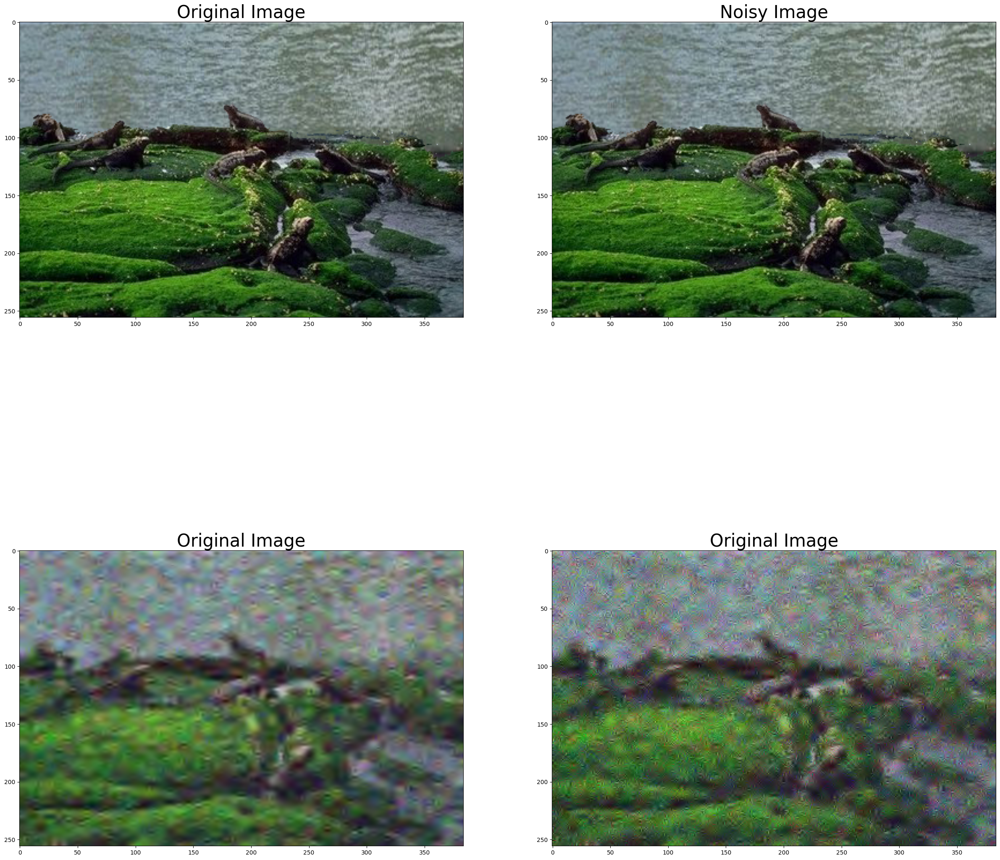

In [ ]:
# Plotting images
plt.figure(figsize=(30,30))

plt.subplot(2,2,1)
plt.imshow(img_f,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,2)
plt.imshow(img_f,cmap=plt.cm.gray)
plt.title('Noisy Image',fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_bayes,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_visushrink,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.show()

In [ ]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)

PSNR[Original vs. Noisy Image] 361.20199909921956
PSNR[Original vs. Denoised(VisuShrink)] 67.13684747569651
PSNR[Original vs. Denoised(Bayes)] 68.38614011774149


In [ ]:
# Color-image denoising
from skimage.restoration import (denoise_wavelet,estimate_sigma)
from skimage.util import random_noise
# from sklearn.metrics import peak_signal_noise_ratio
import skimage.io

In [ ]:
def denoise_img(img):
    #img=skimage.io.imread('/content/drive/MyDrive/archive/CASIA2/Tp/Tp_D_CND_M_N_ani00018_sec00096_00138.tif')
    img=skimage.img_as_float(img_f) #converting image as float


    sigma_est=estimate_sigma(img,multichannel=True,average_sigmas=True)  #Noise estimation

    # Denoising using Bayes
    img_bayes=denoise_wavelet(img,method='BayesShrink',mode='soft',wavelet_levels=3,
                          wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)


    #Denoising using Visushrink
    img_visushrink=denoise_wavelet(img,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
    wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)
    return img_bayes

In [ ]:
image_size = (128, 128)

In [ ]:
def prepare_image(image_path):
    ela_image = convert_to_ela_image(image_path, 91)
    return np.array(ela_image.resize(image_size)).flatten() / 255.0

In [ ]:
X = [] # ELA converted images
Y = [] # 0 for fake, 1 for real

In [ ]:
#denoising images
import random
import os
path = "/content/drive/MyDrive/CASIA2/Au"
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append(1)
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

random.shuffle(X)
X = X[:2100]
Y = Y[:2100]
print(len(X), len(Y))

Processing 500 images
Processing 1000 images
Processing 1500 images
Processing 2000 images
Processing 2500 images
Processing 3000 images
Processing 3500 images
Processing 4000 images
Processing 4500 images
Processing 5000 images
Processing 5500 images
Processing 6000 images
Processing 6500 images
Processing 7000 images
2100 2100


In [ ]:
path = "/content/drive/MyDrive/CASIA2/Tp"
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append(0)
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

print(len(X), len(Y))

Processing 2500 images
Processing 3000 images
Processing 3500 images
Processing 4000 images
4185 4185


# GPU Checking

In [ ]:
import tensorflow as tf

# Check if GPU is available
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print("GPUs are available")
    for gpu in gpus:
        print(f"GPU: {gpu}")
else:
    print("No GPUs available")


GPUs are available
GPU: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [ ]:
import numpy as np
X = np.array(X)
Y = to_categorical(Y, 2)
X = X.reshape(-1, 128, 128, 3)

In [ ]:
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size = 0.2, random_state=5)
X = X.reshape(-1,128,128,3)
print(len(X_train), len(Y_train))
print(len(X_val), len(Y_val))

3348 3348
837 837


In [ ]:
def build_model():
    model = Sequential()
    model.add(Conv2D(filters=32, kernel_size=(5, 5), padding='valid', activation='relu', input_shape=(128, 128, 3)))
    model.add(Conv2D(filters=32, kernel_size=(5, 5), padding='valid', activation='relu'))
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(2, activation='softmax'))  # Ensure 2 units for binary classification
    return model

In [ ]:
model = build_model()
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 124, 124, 32)        │           2,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 120, 120, 32)        │          25,632 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 60, 60, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 60, 60, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 115200)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │      29,491,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │             514 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 29,520,034 (112.61 MB)

 Trainable params: 29,520,034 (112.61 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from keras import optimizers
# Compile the model before fitting
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
epochs = 40
batch_size = 32

In [ ]:
from tensorflow.keras.optimizers import Adam

init_lr = 1e-4
epochs = 40 # Set your number of epochs
optimizer = Adam(learning_rate=init_lr, decay=init_lr/epochs)  # or use 'weight_decay' if using TensorFlow 2.x


/usr/local/lib/python3.11/dist-packages/keras/src/optimizers/base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


In [ ]:
import numpy as np  # Importing NumPy to use the np alias

from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator

x_train2 = np.array(X_train, copy=True)
y_train2 = np.array(Y_train, copy=True)

datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=10,
    fill_mode='nearest',
    validation_split=0.2
)

# compute quantities required for featurewise normalization
datagen.fit(X_train)

print(type(X_train))

earlystopping = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=15, verbose=0, mode='min')

validation_generator = datagen.flow(x_train2, y_train2, batch_size=32, subset='validation')
train_generator = datagen.flow(x_train2, y_train2, batch_size=32, subset='training')

X_val_processed = datagen.flow(X_val, Y_val, batch_size=32, shuffle=False)  # Set shuffle=False for validation

<class 'numpy.ndarray'>


# Serial Execution

In [ ]:
import os
import time
import tensorflow as tf

# Disable parallelism (Force Serial Execution)
# Move these lines to the beginning of your script or before any TensorFlow operations:
os.environ["TF_INTER_OP_PARALLELISM_THREADS"] = "1"
os.environ["TF_INTRA_OP_PARALLELISM_THREADS"] = "1"



# Train the model on CPU
with tf.device('/CPU:0'):
    model_serial = build_model()

    # Compile the model_serial before fitting
    model_serial.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    start_time = time.time()
    model_serial.fit(train_generator, epochs=5, validation_data=validation_generator, verbose=1)
    serial_time = time.time() - start_time

print(f"⏳ Serial Training Time (CPU): {serial_time:.2f} seconds")

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
84/84 ━━━━━━━━━━━━━━━━━━━━ 497s 6s/step - accuracy: 0.6412 - loss: 2.2104 - val_accuracy: 0.7803 - val_loss: 0.5757
Epoch 2/5
84/84 ━━━━━━━━━━━━━━━━━━━━ 476s 6s/step - accuracy: 0.7998 - loss: 0.5635 - val_accuracy: 0.8700 - val_loss: 0.4241
Epoch 3/5
84/84 ━━━━━━━━━━━━━━━━━━━━ 522s 6s/step - accuracy: 0.8342 - loss: 0.4361 - val_accuracy: 0.8714 - val_loss: 0.3547
Epoch 4/5
84/84 ━━━━━━━━━━━━━━━━━━━━ 469s 6s/step - accuracy: 0.8764 - loss: 0.3554 - val_accuracy: 0.9103 - val_loss: 0.3017
Epoch 5/5
84/84 ━━━━━━━━━━━━━━━━━━━━ 472s 6s/step - accuracy: 0.8942 - loss: 0.3041 - val_accuracy: 0.8700 - val_loss: 0.3501
⏳ Serial Training Time (CPU): 2436.73 seconds


# Parallel Execution

In [ ]:
import time
import tensorflow as tf
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Enable data parallelism using MirroredStrategy
strategy = tf.distribute.MirroredStrategy()

# Ensure GPU is used
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("✅ GPU Available: Using Parallel Execution")
    except RuntimeError as e:
        print(e)
else:
    print("⚠️ No GPU Found, Running on CPU Instead")

# Compute class weights to handle SP < AU imbalance
class_weights = compute_class_weight(class_weight="balanced", classes=np.array([0, 1]), y=Y_train)
class_weights_dict = {0: class_weights[0], 1: class_weights[1]}  # Assign weights to AU (0) and SP (1)

# Train the model on GPU
with tf.device('/GPU:0'):
    model_parallel = build_model()

    # Compile the model with weighted loss
    model_parallel.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    start_time = time.time()

    # Train with class weights
    history = model_parallel.fit(
        X_train, Y_train,
        validation_data=(X_val, Y_val),
        batch_size=32, epochs=40,
        class_weight=class_weights_dict  # Apply class weights
    )

    parallel_time = time.time() - start_time

print(f"⚡ Parallel Training Time (GPU): {parallel_time:.2f} seconds")


Physical devices cannot be modified after being initialized
Epoch 1/40
105/105 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - accuracy: 0.6147 - loss: 0.8084 - val_accuracy: 0.8196 - val_loss: 0.4682
Epoch 2/40
105/105 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.8562 - loss: 0.4174 - val_accuracy: 0.8674 - val_loss: 0.3974
Epoch 3/40
105/105 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.8756 - loss: 0.3642 - val_accuracy: 0.8710 - val_loss: 0.3451
Epoch 4/40
105/105 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.9063 - loss: 0.2733 - val_accuracy: 0.9152 - val_loss: 0.2147
Epoch 5/40
105/105 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - accuracy: 0.9202 - loss: 0.2032 - val_accuracy: 0.9200 - val_loss: 0.2091
Epoch 6/40
105/105 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - accuracy: 0.9424 - loss: 0.1445 - val_accuracy: 0.9200 - val_loss: 0.2021
Epoch 7/40
105/105 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 0.9602 - loss: 0.1211 - val_accuracy: 0.8984 - val_loss: 0.2589
Epoch 8/40
105/105 ━━━━━━━━━━━━━━━━

# Performance Comparison

In [ ]:
serial_time=2436.73
parallel_time=196.47
speedup = (serial_time / parallel_time)*40/5 # epoch in parallel
print(f"Speedup Factor: {speedup:.2f}x")


Speedup Factor: 99.22x


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(
    monitor='val_accuracy',  # or 'val_acc' depending on your TensorFlow version
    mode='max',               # Maximize accuracy
    patience=10,              # Number of epochs with no improvement before stopping
    verbose=1                 # To show early stopping logs
)


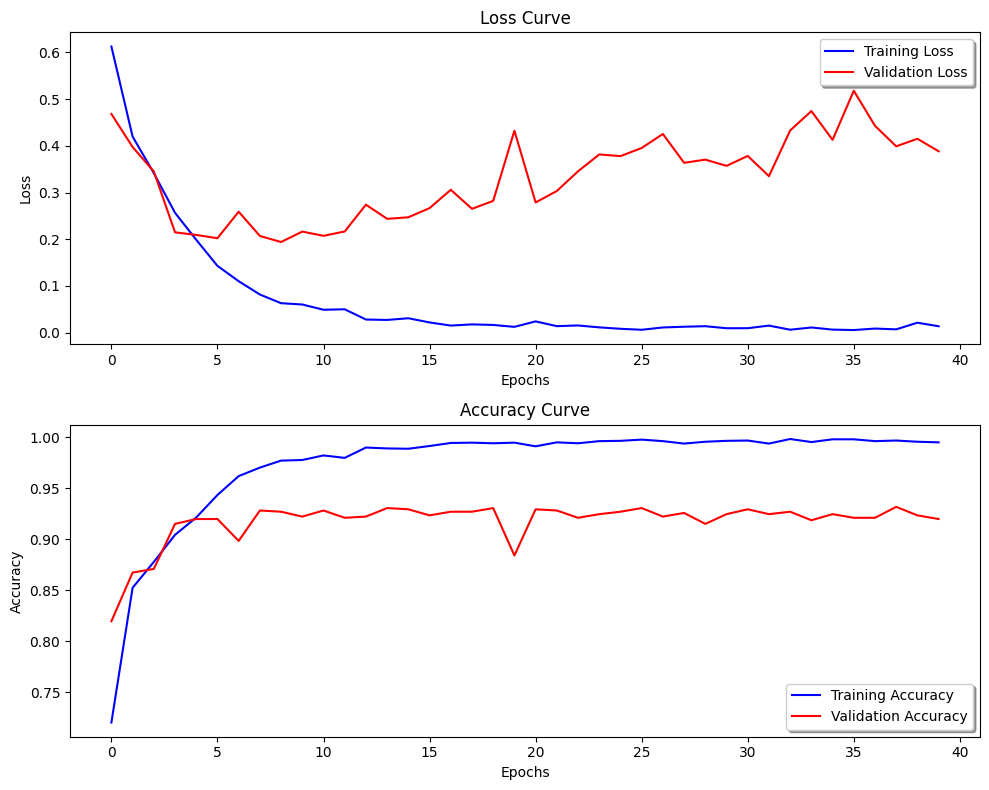

In [ ]:
import matplotlib.pyplot as plt

# Create subplots for loss and accuracy
fig, ax = plt.subplots(2, 1, figsize=(10, 8))

# Plotting training and validation loss
ax[0].plot(history.history['loss'], color='b', label="Training Loss")
ax[0].plot(history.history['val_loss'], color='r', label="Validation Loss")
ax[0].set_title("Loss Curve")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")
ax[0].legend(loc='best', shadow=True)


# Plotting training and validation accuracy
ax[1].plot(history.history['accuracy'], color='b', label="Training Accuracy")
ax[1].plot(history.history['val_accuracy'], color='r', label="Validation Accuracy")
ax[1].set_title("Accuracy Curve")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Accuracy")
ax[1].legend(loc='best', shadow=True)


# Adjust layout and display the plot
plt.tight_layout()
plt.show()


# F1 Score

In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Get predicted class labels
y_pred = model_parallel.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class indices
y_true_classes = np.argmax(Y_val, axis=1)   # Convert one-hot labels to class indices

# Generate classification report
print(classification_report(y_true_classes, y_pred_classes))


27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
              precision    recall  f1-score   support

           0       0.95      0.89      0.92       420
           1       0.89      0.95      0.92       417

    accuracy                           0.92       837
   macro avg       0.92      0.92      0.92       837
weighted avg       0.92      0.92      0.92       837



27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


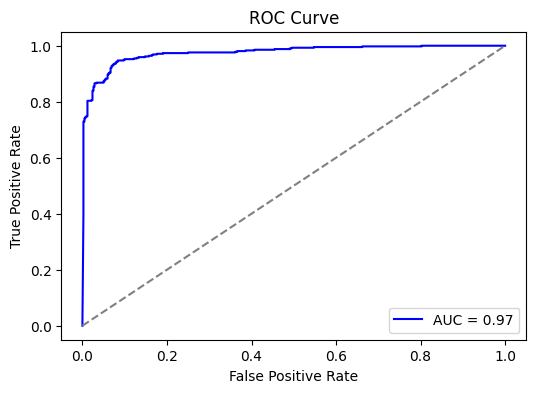

In [ ]:
from sklearn.metrics import roc_curve, auc

# Get probability predictions (not class labels)
y_pred_probs = model_parallel.predict(X_val)[:, 1]  # Get probability for class 1

# Compute ROC curve
fpr, tpr, _ = roc_curve(y_true_classes, y_pred_probs)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}", color="blue")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()


In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


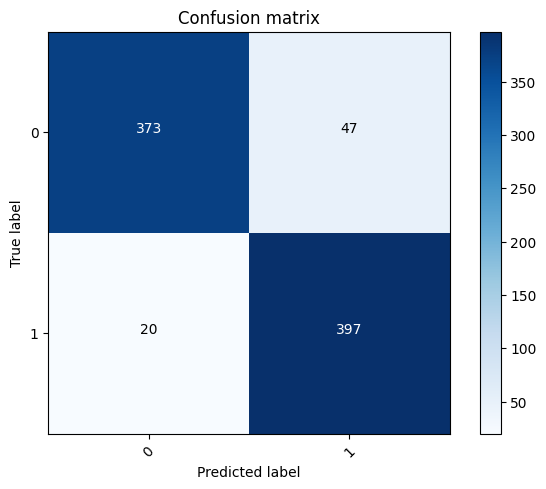

In [ ]:
# Predict the values from the validation dataset
Y_pred = model_parallel.predict(X_val)
# Convert predictions classes to one hot vectors
Y_pred_classes = np.argmax(Y_pred,axis = 1)
# Convert validation observations to one hot vectors
Y_true = np.argmax(Y_val,axis = 1)
# compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes)
# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(2))
plt.show()

In [ ]:
class_names = ['fake', 'real']

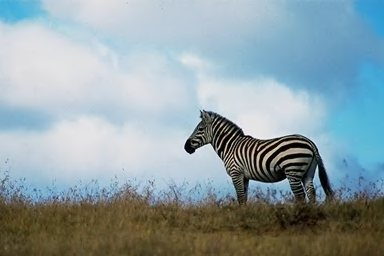

In [ ]:
real_image_path = "/content/drive/MyDrive/CASIA2/Au/Au_ani_00001.jpg"
Image.open(real_image_path)

In [ ]:
image = prepare_image(real_image_path)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
Class: real Confidence: 50.67


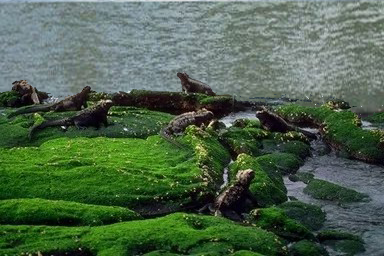

In [ ]:
fake_image_path ="/content/drive/MyDrive/CASIA2/Tp/Tp_D_CND_M_N_ani00018_sec00096_00138.tif"
Image.open(fake_image_path)

In [ ]:
image = prepare_image(fake_image_path)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
Class: fake Confidence: 50.41


In [ ]:
fake_image = os.listdir("/content/drive/MyDrive/CASIA2/Tp")
correct = 0
total = 0
for file_name in fake_image:
    if file_name.endswith('jpg') or filename.endswith('png'):
        fake_image_path = os.path.join("/content/drive/MyDrive/CASIA2/Tp", file_name)
        image = prepare_image(fake_image_path)
        image = image.reshape(-1, 128, 128, 3)
        y_pred = model.predict(image)
        y_pred_class = np.argmax(y_pred, axis = 1)[0]
        total += 1
        if y_pred_class == 0:
            correct += 1
#             print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━

In [ ]:
print(f'Total: {total}, Correct: {correct}, Acc: {correct / total * 100.0}')

Total: 2085, Correct: 1226, Acc: 58.80095923261391


In [ ]:
real_image = os.listdir("/content/drive/MyDrive/CASIA2/Au")
correct_r = 0
total_r = 0
for file_name in real_image:
    if file_name.endswith('jpg') or filename.endswith('png'):
        real_image_path = os.path.join("/content/drive/MyDrive/CASIA2/Au", file_name)
        image = prepare_image(real_image_path)
        image = image.reshape(-1, 128, 128, 3)
        y_pred = model.predict(image)
        y_pred_class = np.argmax(y_pred, axis = 1)[0]
        total_r += 1
        if y_pred_class == 1:
            correct_r += 1
#             print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

Streaming output truncated to the last 5000 lines.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

In [ ]:
correct += correct_r
total += total_r
print(f'Total: {total_r}, Correct: {correct_r}, Acc: {correct_r / total_r * 100.0}')
print(f'Total: {total}, Correct: {correct}, Acc: {correct / total * 100.0}')

Total: 7371, Correct: 2813, Acc: 38.16307149640483
Total: 9456, Correct: 4039, Acc: 42.71362098138748


In [ ]:
model_parallel.save("model.h5")

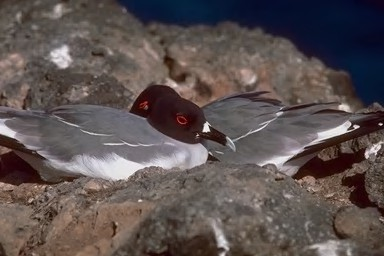

In [ ]:
image_path1 = "/content/drive/MyDrive/CASIA1/Au/Au_ani_0008.jpg"
Image.open(image_path1)

In [ ]:
image = prepare_image(image_path1)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Class: fake Confidence: 50.11


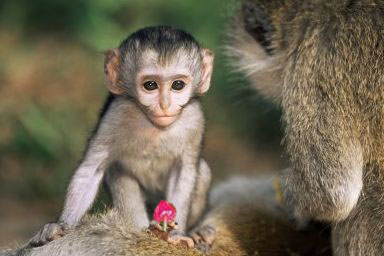

In [ ]:
image_path2 = "/content/drive/MyDrive/CASIA1/Sp/Sp_D_CNN_C_ani0068_ani0045_0099.jpg"
Image.open(image_path2)

In [ ]:
image = prepare_image(image_path2)  # Prepare the image using your function
image = image.reshape(-1, 128, 128, 3)  # Reshape to match model input dimensions

# Predict the class
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis=1)[0]  # Get predicted class index

# Display the result
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}%')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Class: real Confidence: 50.29%


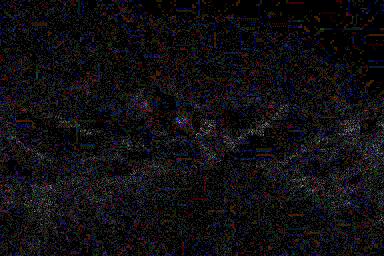

In [ ]:
convert_to_ela_image(image_path1, 91)

In [ ]:
image_1_ELA=convert_to_ela_image(image_path1, 91)

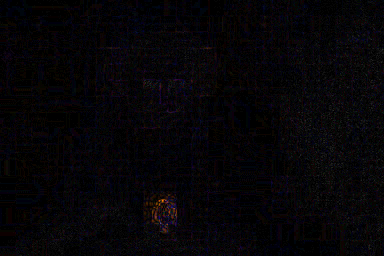

In [ ]:
convert_to_ela_image(image_path2, 91)

In [ ]:
image_2_ELA=convert_to_ela_image(image_path2, 91)

In [ ]:
ela_image = ImageChops.difference(image_1_ELA, image_2_ELA)

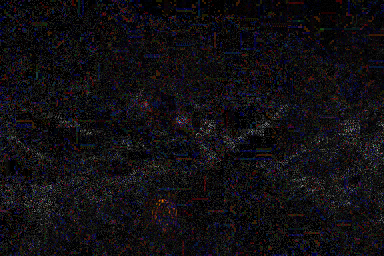

In [ ]:
ela_image

In [ ]:
print(y_pred_class)

1


In [ ]:
def find_manipulated_region(ela, threshold=50):
    mask = np.array(ela) > threshold

    # Find the bounding box of the masked region
    if np.any(mask):
        coords = np.argwhere(mask)
        return coords
    else:
        return None

In [ ]:
def make_pixels_white(img, white_coords):
    width, height = img.size
    black_img = Image.new('RGB', (width, height), color='black')
    img_arr = np.array(img)
    black_arr = np.array(black_img)
    for coord in white_coords:
        x, y, z = coord
        black_arr[x,y,:] = [255,255,255]
    mask = np.all(black_arr == [255,255,255], axis=-1)
    img_arr[mask] = [255,255,255]
    new_img = Image.fromarray(img_arr)
    return new_img

In [ ]:
if y_pred_class==0:
    ela=convert_to_ela_image(image_path2,91)
    coords=find_manipulated_region(ela)
    modify_boundary=make_pixels_white(ela,coords)
    modify_boundary.show()